# *Pós-graduação em Ciência e Dados e Machine Learning*
### *Trabalho Final - Machine Learning*

**Disciplina:** Introdução à Aprendizagem de Máquina

**Professor:** André Juan Costa Vieira

**Turma:** B

**Nomes dos Integrantes:** 

1 - Amilcar L. do Prado G. Gramacho

2 - Fabiano Alves dos Santos

3 - Leonam Lucas Gonçalves

## Qualidade de vinhos. 

Você foi contratado como cientista de dados pela famosa vinícula **"Vini Tradizionali di Manduria"** para analisar todos os aspectos dos vinhos produzidos. Diversas questões foram levantadas, como: Compreender os padrões das características que proporcionam bons vinhos, a classificação da qualidade de novos vinhos produzidos, antes que a comunidade mundial **"Vins Spectaculaires"** os deguste, apontar quais são os novos **"blends"** que podem ter continuidade no desenvolvimento, dentre várias outras atividades que visam as boas tomadas de decisões, sempre com o intuito de servir os melhores rótulos, aumentando os lucros e diminuindo os gastos.        

A equipe de enólogos fazem estudos frequentes para verificar as características de cada vinho, colocando-os em planilhas. Para melhor compreensão dos dados, descreveram o que significado de cada propriedade.   


##### Descrição 

**0. Color:** Se o vinho é tinto (vermelho) ou branco

**1. Fixed Acidity:** Qtd.de Ácido não volátil, aquele que não evapora fácil

**2. Volatile Acidity:** Teor de ácido acético que leva a um sabor desagradável de vinagre

**3. Citric Acid:** Um tipo de ácido que age como conservante para aumentar o nível de acidez em pequena quantidade para adicionar aroma e sabor

**4. Residual Sugar:** Qtd. de açúcar restante depois da fermentação, mais de 45g/litro é doce

**5. Chlorides:** Qtd. de sal

**6. Free Sulfur Dioxide:** Componente que impede crescimento microbiano e a oxidação do vinho

**7. Total Sulfur Dioxide:** Qtd. de SO2 (dióxido de enxofre)

**8. Density:** Massa/Volume, os vinhos mais doces tem maior densidade

**9. pH:** Nível de acidez ou potencial hidrogeniônico

**10. Sulphates:** Um adicional que contribui para níveis de SO2 e é 
anti-micróbio e anti-oxidante 

**11. Alcohol:** Qtd. de álcool

**12. Qualidade:** Notas de 0 a 10

# Questões

### Importe todas as bibliotecas necessárias na célula abaixo
##### Organize-as de forma crescente em relação ao tamanho da frase

In [1]:
import numpy as np
import pandas as pd
from math import sqrt
import seaborn as sns
from sklearn import svm
import scipy.stats as st
from sklearn import utils
from numpy import linspace
from sklearn import metrics
import plotly.express as px
from sklearn import preprocessing
from xgboost import XGBClassifier
import plotly.graph_objects as go
from sklearn.cluster import KMeans
import plotly.figure_factory as ff
from xgboost import plot_importance
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from scipy.stats.kde import gaussian_kde
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import recall_score, f1_score, mean_absolute_error, mean_squared_error, roc_auc_score, accuracy_score, precision_score, classification_report,confusion_matrix, roc_curve

### Tratamento dos Dados

###### Faltantes e Incongruentes
Sir Pounce, enólogo de longa data, especializado em vinhos italianos, descobriu que estão faltando alguns valores nas planilhas, e que outros dados foram alterados pelo ex-funcionário Smeagle, dispensado por degustar vinhos 'preciosos'.   

**Utilize o dataset 'wines_pre_processing.csv'.**

1- Busque os valores faltantes no dataset e trate-os.

2- Busque os valores incongruentes no dataset e trate-os. 

3- Valide seus tratamentos com o dataset 'wines.csv'.

O dono da vinícula, Sir Donald Shelby, tem um filho cursando especialização em ciência de dados, que, ao deparar-se com o dataset,  pediu a você que, ao invés de tratar os dados faltantes com suas *técnicas triviais*, fizesse um algoritmo de regressão logística para encontrar os valores faltantes na coluna 'Alcohol'. O Sr. Shelby é um homem conhecido como mafioso e considera seu filho um gênio, por isso, você, com fortes receios de sofrer consequências inusitadas por ordem do Don Corleone da atualidade, acatou o "pedido".

**Utilize o dataset devidamente pré processado.**

4- Desenvolver um algoritmo de regressão logística visando preencher os dados faltantes da coluna "Alcohol". Em seguida, valide os resultados com o dataset "wines.csv", apresentando todas as métricas de classificação estudadas. 

5- Você, ao ver os resultados encontrados por utilizar um algoritmo de classificação num problema de regressão, se adiantou e fez um modelo de regressão polinomial para dirimir a questão. Em seguida, validou os resultados com o dataset "wines.csv", utilizando todas as métricas de regressão estudadas. Por fim, escreverá um e-mail explicando o motivo <u>técnico</u> que o levou a não utilizar a regressão logistíca neste problema.

Primeiramente devemos importar os dados que buscaremos tratar e aqueles que serão tomados como referência para as comparações apontadas no exercício. Para isso, chamaremos de `df_pre` aqueles dados que ainda não sofreram nenhum tipo de modelagem, e `df_target` aqueles que tomaremos como parâmetro para se alcançar.

In [179]:
wines_splines = pd.read_csv('https://gist.githubusercontent.com/LeonamLucas/216960370108c834a7063cea0d940e64/raw/e0dcc91ce1bc4fff8893790e1d5d8589abad361f/wines_splines.csv')
wines_hacked = pd.read_csv('https://gist.githubusercontent.com/LeonamLucas/216960370108c834a7063cea0d940e64/raw/d46701e003a92d929677c29e3fa9bc4a0732f803/wines_hacked.csv')
questao_final = pd.read_csv('https://gist.githubusercontent.com/LeonamLucas/216960370108c834a7063cea0d940e64/raw/e0dcc91ce1bc4fff8893790e1d5d8589abad361f/questao_final.csv')
df_pre = pd.read_csv('https://gist.githubusercontent.com/LeonamLucas/216960370108c834a7063cea0d940e64/raw/e0dcc91ce1bc4fff8893790e1d5d8589abad361f/wines_pre_processing.csv')
df_target = pd.read_csv('https://gist.githubusercontent.com/LeonamLucas/216960370108c834a7063cea0d940e64/raw/e0dcc91ce1bc4fff8893790e1d5d8589abad361f/wines.csv')

Agora que importamos os dados a serem usados, iniciaremos nossa análise checando a estrutura dos dataframes. Considerando que o `df_target` é a versão corretamente manipulada do `df_pre`, as seguintes análises serão feitas apenas sobre o `df_pre`, visto que obtivemos o `df_target` a partir de um backup não autorizado.

In [4]:
df_pre.head()

,Unnamed: 0,color,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,white,6.6,0.42,0.33,2.8,0.034,15.0,85.0,0.99,3.28,0.51,13.4,6
1,1,red,6.9,0.63,0.02,1.9,0.078,18.0,30.0,0.99712,3.4,0.75,9.8,5
2,2,white,6.9,0.36,0.34,4.2,0.018,57.0,119.0,0.9898,3.28,0.36,12.7,9
3,3,white,6.7,0.11,0.34,8.8,0.043,41.0,113.0,0.9962,3.42,0.4,9.3,7
4,4,white,7.1,0.2,0.34,16.0,0.05,51.0,166.0,0.9985,3.21,0.6,9.2,6


Ao olhar as primeiras linhas do dataframe, juntamente com todas as colunas, podemos perceber que aparentemente todas as variáveis apresentadas deveriam ser do tipo numéricas, com excessão de `color`, que indica se o vinho é tinto ou branco a partir de caracteres. Vamos checar se isso se reflete na realidade.

In [5]:
df_pre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Unnamed: 0            6497 non-null   int64 
 1   color                 6494 non-null   object
 2   fixed acidity         6490 non-null   object
 3   volatile acidity      6495 non-null   object
 4   citric acid           6493 non-null   object
 5   residual sugar        6495 non-null   object
 6   chlorides             6490 non-null   object
 7   free sulfur dioxide   6495 non-null   object
 8   total sulfur dioxide  6496 non-null   object
 9   density               6496 non-null   object
 10  pH                    6495 non-null   object
 11  sulphates             6491 non-null   object
 12  alcohol               6493 non-null   object
 13  quality               6497 non-null   object
dtypes: int64(1), object(13)
memory usage: 710.7+ KB


Como podemos observar acima, apenas a coluna `Unnamed: 0` se mostrou como numérica. Entretanto, aparentemente esta coluna está trazendo um valor diferente para cada vinho, da mesma forma que o índice. Ou seja, ela não traz nenhum tipo de informação relevante para uma futura modelagem dos dados. Vamos checar se a quantidade de valores únicos de `Unnamed: 0` é igual ao número de linhas do dataset. Em caso afirmativo, podemos retirá-la sem prejuízo algum à nossa análise.

In [6]:
df_pre['Unnamed: 0'].nunique()

6497

Como podemos observar no resultado de `df_pre.info()`, os dados possuem 6497 observações, que é exatamente a mesma quantidade de valores únicos de `Unnamed: 0`. Como esta coluna não está descrita na apresentação do problema, de forma a poder ser entendida como um valor contínuo que realmente poderia não ter os mesmos valores em observações distintas, mas mesmo assim trazer algum tipo de informação ao banco de dados, iremos removê-la, sem prejuízo.

Para diferenciar dos dados brutos que importamos para o problema, chamaremos o novo dataframe criado de `df_processado`, e qualquer tipo de tratamento será feito sobre ele a partir daqui.

In [7]:
df_processado = df_pre.drop('Unnamed: 0', axis = 1)

Agora que já retiramos a coluna que aparentemente não trazia nenhuma informação relevante aos nossos dados, podemos verificar onde há valores faltantes.

In [8]:
df_processado.isnull().sum()

color                   3
fixed acidity           7
volatile acidity        2
citric acid             4
residual sugar          2
chlorides               7
free sulfur dioxide     2
total sulfur dioxide    1
density                 1
pH                      2
sulphates               6
alcohol                 4
quality                 0
dtype: int64

Para melhor visualização, vamos retornar o `df_processado` apenas com as linhas onde conseguimos observar valores faltantes.

In [9]:
df_processado[df_processado.isnull().any(axis = 1)]

,color,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
271,red,7.2,0.25,NaN,2.5,0.063,11.0,41.0,0.99439,3.52,0.8,12.4,7
691,white,7.3,0.13,0.32,14.4,NaN,34.0,109.0,0.9974,3.2,0.35,9.2,6
775,white,6.7,0.26,0.29,7.1,0.036,28.0,100.0,0.99534,3.08,NaN,9.3,6
1039,white,6.8,0.39,0.31,14.35,0.043,28.0,NaN,0.9988,3.17,0.54,9.1,5
1203,white,NaN,0.26,0.28,4.8,0.05,34.0,150.0,0.99437,3.13,0.5,10.0,6
1382,white,7.7,0.35,0.46,11.8,0.088,61.0,183.0,0.99786,2.86,0.47,NaN,5
1741,white,6.8,0.73,0.2,6.6,0.054,25.0,65.0,0.99324,3.12,NaN,11.1,4
1747,red,4.6,0.52,0.15,2.1,0.054,8.0,65.0,0.9934,3.9,0.56,NaN,4
1862,white,8.0,0.23,0.28,2.7,0.048,NaN,165.0,0.9952,3.26,0.72,9.5,6
1877,red,11.6,0.32,0.55,2.8,0.081,35.0,67.0,1.0002,3.32,NaN,10.8,7


In [10]:
df_processado[df_processado.isnull().any(axis = 1)].shape

(41, 13)

Pelos resultados acima, vemos que do total de 6497 observações iniciais, apenas 41 possuem algum tipo de valor faltante (`NAN`), o que representa algo por volta de 0,6% do total. Considerando essa taxa tão baixa de observações com valores faltantes, poderíamos optar por retirá-las de nosso banco de dados ao invés de substituir por medidas de tendência central como `média` ou `mediana`, por exemplo. Entretanto, para evitar confusão com Sir Donald Shelby, substituiremos os valores não observados justamente com essas medidas mencionadas.

Para termos um parâmetro dos valores que queremos encontrar, vamos visualizar o `df_target`, apenas com as observações onde o `df_pre` possui `NA`.

In [11]:
df_target[df_pre.isnull().any(axis = 1)]

,color,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
271,red,7.2,0.250,0.37,2.50,0.063,11.0,41.0,0.99439,3.52,0.80,12.4,7
691,white,7.3,0.130,0.32,14.40,0.051,34.0,109.0,0.99740,3.20,0.35,9.2,6
775,white,6.7,0.260,0.29,7.10,0.036,28.0,100.0,0.99534,3.08,0.36,9.3,6
1039,white,6.8,0.390,0.31,14.35,0.043,28.0,162.0,0.99880,3.17,0.54,9.1,5
1203,white,8.0,0.260,0.28,4.80,0.050,34.0,150.0,0.99437,3.13,0.50,10.0,6
1382,white,7.7,0.350,0.46,11.80,0.088,61.0,183.0,0.99786,2.86,0.47,9.0,5
1741,white,6.8,0.730,0.20,6.60,0.054,25.0,65.0,0.99324,3.12,0.28,11.1,4
1747,red,4.6,0.520,0.15,2.10,0.054,8.0,65.0,0.99340,3.90,0.56,13.1,4
1862,white,8.0,0.230,0.28,2.70,0.048,49.0,165.0,0.99520,3.26,0.72,9.5,6
1877,red,11.6,0.320,0.55,2.80,0.081,35.0,67.0,1.00020,3.32,0.92,10.8,7


Tomemos como exemplo a coluna `citric acid`. É possível observar que para o vinho de índice 271, que é do tipo `vermelho`, o valor observado é de `0,37`. Ao checarmos o vinho de índice 3590, por exemplo, já vemos que o valor observado na coluna `citric acid` é de `0,10`, e o tipo do vinho segue sendo `vermelho`.

Tendo o exposto em mente, podemos concluir que não é possível recuperar exatamente os valores faltantes a partir de métodos estatísticos simples.

 Sendo assim, e considerando também que futuramente encontraremos os valores de `alcohol` a partir de uma regressão logística, substituiremos os `NAs` das outras colunas por alguma medida de distribuição central, como `média` ou `mediana`, dependendo do que observarmos da forma com que os dados estão distribuídos.

Importante destacar, entretanto, que antes de realizarmos qualquer tipo de cálculo com as colunas do dataframe, precisamos transformá-las em valores numéricos.

Sendo assim, transformaremos todas as colunas em numéricas, com exceção da primeira, que temos certeza de que deve ser em formato de string.

In [12]:
for col in df_processado.columns[1:]:
    df_processado[col] = df_processado[col].astype(float)

df_processado.info

ValueError: could not convert string to float: 'leonidas, para te arrumar essas "confusão"'

O erro acima nos diz que não foi possível transformar a string `leonidas, para te arrumar essas "confusão"` em numérica, então vamos checar onde essa entrada está sendo representada no dataframe.

In [13]:
df_processado[(df_processado == 'leonidas, para te arrumar essas "confusão"').any(axis = 1)]

,color,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
519,"leonidas, para te arrumar essas ""confusão""",7.4,0.24,0.31,8.4,0.045,52.0,183.0,0.9963,3.09,0.32,8.8,5
607,white,"leonidas, para te arrumar essas ""confusão""",0.26,0.74,13.3,0.044,68.0,224.0,0.9972,3.18,0.54,9.5,6
830,white,6.9,0.28,0.4,8.2,0.036,15.0,"leonidas, para te arrumar essas ""confusão""",0.9944,3.17,0.33,10.2,5
1604,red,8.1,0.82,0.0,4.1,0.095,5.0,14.0,0.99854,3.36,0.53,"leonidas, para te arrumar essas ""confusão""",5
3136,white,6.1,0.24,"leonidas, para te arrumar essas ""confusão""",1.7,0.033,61.0,134.0,0.9903,3.19,0.81,11.9,7
3885,red,"leonidas, para te arrumar essas ""confusão""",0.67,0.22,2.7,0.107,17.0,34.0,1.0004,3.28,0.98,9.9,6
5596,white,7.2,0.23,0.46,6.4,"leonidas, para te arrumar essas ""confusão""",17.0,85.0,0.99279,3.1,0.78,11.7,6
5773,white,6.7,0.27,0.26,2.3,0.043,"leonidas, para te arrumar essas ""confusão""",181.0,0.99394,3.45,0.63,10.6,6
5832,white,"leonidas, para te arrumar essas ""confusão""",0.21,0.24,4.4,0.027,37.0,150.0,0.991,3.3,0.31,11.5,7
5903,red,8.3,0.58,"leonidas, para te arrumar essas ""confusão""",2.9,0.096,14.0,63.0,0.9984,3.17,0.62,9.1,6


Podemos checar que a string indicada está presente em quase todas as colunas, o que nos faz crer que podem haver outras strings no meio do dataset. Sendo assim, buscaremos removê-las inserindo o argumento de coerção.

In [14]:
for col in df_processado.columns[1:]:
  df_processado[col] = pd.to_numeric(df_processado[col], errors = 'coerce')

Checando novamente o resultado para conferir que conseguimos transformar para o formato desejado.

In [15]:
df_processado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   color                 6494 non-null   object 
 1   fixed acidity         6479 non-null   float64
 2   volatile acidity      6484 non-null   float64
 3   citric acid           6482 non-null   float64
 4   residual sugar        6484 non-null   float64
 5   chlorides             6479 non-null   float64
 6   free sulfur dioxide   6484 non-null   float64
 7   total sulfur dioxide  6485 non-null   float64
 8   density               6485 non-null   float64
 9   pH                    6484 non-null   float64
 10  sulphates             6480 non-null   float64
 11  alcohol               6482 non-null   float64
 12  quality               6492 non-null   float64
dtypes: float64(12), object(1)
memory usage: 660.0+ KB


Percebemos que agora não recebemos nenhum tipo de mensagem de erro. Sendo assim, vamos verificar como estão distribuídos os dados em cada uma das variáveis, para podermos definir qual medida usaremos para substituir os valores de `NA` encontrados.

In [16]:
df_plot = df_processado.drop('color', axis = 1)
fig = px.box(df_plot, y = df_plot.columns)
fig.show()

O gráfico acima nos mostra quais variáveis possuem uma distribuição mais esparsa e quais estão mais concentradas. Entretanto, é importante destacar que as escalas das unidades de cada variável podem ser diferentes. Sendo assim, plotaremos cada uma individualmente, para auxiliar na avaliação.

In [17]:
for i in df_processado.drop('color', axis = 1).columns:
  fig = px.box(df_plot.loc[:,i])
  fig.show()

Como conseguimos observar pelos gráficos acima, as colunas `free sulfur dioxide`, `total sulfur dioxide` e `residual sugar` possuem as distribuições mais espalhadas. Tendo isso em mente, os valores `NA` delas serão substituídos por sua `mediana`, enquanto os `NA` do restante das variáveis serão substituídos pela média.

Importante destacar que para a coluna `quality`, teremos que arredondar o valor da média, para que mantenhamos o padrão do dataset, e o Sr. Shelby não fique com raiva.

In [18]:
for col in df_processado.columns[1:]:
  if col != 'alcohol':
    if col == 'free sulfur dioxide' or col == 'total sulfur dioxide' or col == 'residual sugar':
      df_processado[col] = df_processado[col].fillna(df_processado[col].median())
    elif col == 'quality':
      df_processado[col] = df_processado[col].fillna(df_processado[col].mean()).round()
    else:
      df_processado[col] = df_processado[col].fillna(df_processado[col].mean())

Checando agora a quantidade de `NAs` por coluna.

In [19]:
df_processado.isnull().sum()

color                    3
fixed acidity            0
volatile acidity         0
citric acid              0
residual sugar           0
chlorides                0
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       0
sulphates                0
alcohol                 15
quality                  0
dtype: int64

Agora que tratamos as colunas numéricas, podemos nos desbruçar sobre a variável `color` que, a princípio, deveria indicar apenas `vermelho` ou `branco` para o vinho. Se tudo estiver correto, poderemos transformar em uma variável dummy que indicaria 1 caso o vinho fosse tinto (vermelho), e 0 caso contrário.

Vamos checar os valores únicos da variável.

In [20]:
df_processado.color.unique()

array(['white', 'red', 'dois',
       'leonidas, para te arrumar essas "confusão"', 'amo', 'vinho ruim',
       nan, 'deep learning', 'my precious', 'vai dar não', 'bart', 'ml'],
      dtype=object)

Pelos resultados acima, é possível verificar que existem entradas diferentes das esperadas. Sendo assim, ao invés de transformarmos em dummies, faremos a partir de uma condicional que retorna `NA` para aqueles valores que não são desejados em nosso dataframe.

In [21]:
df_processado['color'] = df_processado['color'].apply(lambda x: 1 if x == 'red' else (0 if x == 'white' else np.nan))

Agora precisamos lidar com os valores `NA` da coluna `color`. Por ser de natureza categórica, uma regressão linear não se mostra adequada. Entretanto, uma regressão logística pode ser uma alternativa que nos auxiliaria a preencher os valores faltantes.

Diferentemente de modelos de machine learning mais avançados, a regressão logística não exige a separação dos dados em treino e teste para evitar _overfitting_. Sendo assim, apenas retiraremos as observações `NA` para podermos ensinar o modelo.

In [22]:
df_logit = df_processado[df_processado['color'].notna()]
df_prever = df_processado[df_processado['color'].isna()]

df_logit_x = df_logit.drop(["color", "alcohol"], axis = 1).values
df_logit_y = df_logit.loc[:,"color"].values

clf = LogisticRegression(C=1e7)
clf.fit(df_logit_x, df_logit_y)
y_predict = clf.predict(df_prever.drop(["color", "alcohol"], axis = 1).values)

y_predict

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



array([1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0.])

Agora vamos inserir os resultados calculados em nosso dataframe.

In [23]:
df_processado.color[df_processado['color'].isna()] = y_predict

Vamos checar agora se ainda temos `NA` em algum lugar.

In [24]:
df_processado.isnull().sum()

color                    0
fixed acidity            0
volatile acidity         0
citric acid              0
residual sugar           0
chlorides                0
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       0
sulphates                0
alcohol                 15
quality                  0
dtype: int64

Podemos observar que restam apenas os `NA` da coluna que o exercício nos pede para prever.

Criaremos então o algoritmo de regressão logística para encontrar o valor de `alcohol` e armazenaremos os resultados em uma nova coluna, `alcohol_complete`, para que possamos manter as referências dos dados incompletos.

In [25]:
df_alcohol = df_processado[-df_processado.isnull().any(axis = 1)].reset_index(drop = True)

df_alcohol_x = df_alcohol.drop(["alcohol"], axis = 1).values
df_alcohol_y = df_alcohol.loc[:,"alcohol"].values

clf = LogisticRegression(C=1e7)
clf.fit(df_alcohol_x, df_alcohol_y)

ValueError: Unknown label type: 'continuous'

Como era de se esperar, o algoritmo não conseguiu convergir para um resultado. Isso se deve ao fato de a regressão logística ser um algoritmo que depende de uma classificação mais definida, enquanto o que observamos no dataset é um resultado mais contínuo.

Para que consigamos aplicar o algoritmo, precisaremos categorizar os valores da coluna `alcohol`

In [26]:
df_alcohol = df_processado[df_processado['alcohol'].notna()]
df_prever = df_processado[df_processado['alcohol'].isna()]

df_alcohol_x = df_alcohol.drop(["alcohol"], axis = 1).values

# Categorizando de acordo com os valores já presentes na coluna
lab = preprocessing.LabelEncoder()
df_alcohol_y = lab.fit_transform(df_alcohol['alcohol'])

clf = LogisticRegression(C=1e7)
clf.fit(df_alcohol_x, df_alcohol_y)

y_predict = clf.predict(df_prever.drop("alcohol", axis = 1))

# Recuperando os valores originais categorizados
y_predict = lab.inverse_transform(y_predict)

y_predict

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names



array([ 9.4, 10.9,  9.4, 10.9,  9.5,  9.4,  9.5,  9.2, 10.5,  9.5, 11. ,
        9.5,  9.5,  9.5,  9.4])

Agora preenchendo os valores nulos com os dados calculados

In [27]:
df_processado["alcohol_complete"] = df_processado["alcohol"]

df_processado["alcohol_complete"][df_processado["alcohol"].isnull()] = y_predict

Agora podemos avaliar as métricas do modelo previsto.

In [28]:
lab = preprocessing.LabelEncoder()
lab = lab.fit(df_target['alcohol'])

y = lab.transform(df_target['alcohol'][df_processado['alcohol'].isna()]) # valores reais codificados
y_hat = lab.transform(df_processado['alcohol_complete'][df_processado['alcohol'].isna()]) # valores previstos codificados

print('Acurácia: ', np.mean(np.equal(y_hat, y)))
print('relatório', classification_report(y, y_hat))
print('matriz de confusão\n', confusion_matrix(y, y_hat))

y = df_target['alcohol'][df_processado['alcohol'].isna()]
y_hat = df_processado['alcohol_complete'][df_processado['alcohol'].isna()]

print('MAE:', mean_absolute_error(y, y_hat))
print('MSE:', mean_squared_error(y, y_hat))
print('RMSE:', np.sqrt(mean_squared_error(y, y_hat)))

Acurácia:  0.0
relatório               precision    recall  f1-score   support

           5       0.00      0.00      0.00       1.0
           6       0.00      0.00      0.00       1.0
           7       0.00      0.00      0.00       1.0
          10       0.00      0.00      0.00       0.0
          14       0.00      0.00      0.00       0.0
          15       0.00      0.00      0.00       0.0
          19       0.00      0.00      0.00       1.0
          21       0.00      0.00      0.00       1.0
          25       0.00      0.00      0.00       1.0
          27       0.00      0.00      0.00       1.0
          33       0.00      0.00      0.00       1.0
          34       0.00      0.00      0.00       1.0
          36       0.00      0.00      0.00       0.0
          40       0.00      0.00      0.00       1.0
          45       0.00      0.00      0.00       0.0
          49       0.00      0.00      0.00       0.0
          69       0.00      0.00      0.00       1.0
  

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` p

Como podemos observar nos resultados acima, o modelo performou muito mal, de acordo com as métricas de classificação estudadas. A matriz de confusão mostra que nenhuma das previsões foi certeira, e as métricas de Acurácia, precision e recall foram iguais a zero. Podemos checar que estes valores não estão errados printando o resultado esperado e o resultado alcançado, por exemplo:

In [29]:
resultado_logit = pd.DataFrame()

resultado_logit['Valores Esperados'] = df_target['alcohol'][df_processado['alcohol'].isna()]
resultado_logit['Valores Previstos'] = df_processado['alcohol_complete'][df_processado['alcohol'].isna()]


resultado_logit

,Valores Esperados,Valores Previstos
865,9.9,9.4
1151,11.7,10.9
1382,9.0,9.4
1604,9.6,10.9
1747,13.1,9.5
2333,8.8,9.4
2614,10.3,9.5
2703,10.4,9.2
2742,12.2,10.5
3197,12.2,9.5


É importante destacar que as medidas que tomamos como parâmetro para estimar a performance são especialmente indicadas em casos categóricos de classificação (com exceção daquelas que envolvem o cálculo do erro), o que novamente não é o que observamos nesta situação.

Quanto às medidas relacionadas ao erro da regressão, os valores encontrados foram interessantes, mas deixaremos para analisá-los após termos os resultados do próximo modelo.

Espera-se que o modelo polinomial se mostre mais eficiente, e é o que vamos verificar a seguir.

In [30]:
poly_reg = PolynomialFeatures(degree=4)
modelo = make_pipeline(poly_reg, LinearRegression())
modelo.fit(df_processado[df_processado['alcohol'].notna()].drop('alcohol', axis = 1),
             df_processado[df_processado['alcohol'].notna()]['alcohol'])

y_predict = modelo.predict(df_processado[df_processado['alcohol'].isna()].drop('alcohol', axis = 1))

y_predict

array([ 9.40000099, 10.89999293,  9.40000475, 10.90000159,  9.49999781,
        9.39999783,  9.49999748,  9.20000269, 10.49999748,  9.50000068,
       11.        ,  9.49999919,  9.49999951,  9.50001068,  9.39999947])

Adicionando os resultados encontrados em uma nova coluna do dataframe, para manter a comparabilidade.

In [31]:
df_processado["alcohol_complete_poly"] = df_processado["alcohol"]

df_processado["alcohol_complete_poly"][df_processado["alcohol"].isnull()] = y_predict

In [32]:
lab = preprocessing.LabelEncoder()
lab = lab.fit(df_target['alcohol'])

y = lab.transform(df_target['alcohol'][df_processado['alcohol'].isna()]) # valores reais codificados
y_hat = lab.transform(df_processado['alcohol_complete_poly'][df_processado['alcohol'].isna()]) # valores previstos codificados

print('Acurácia: ', np.mean(np.equal(y_hat, y)))
print('relatório', classification_report(y, y_hat))
print('matriz de confusão\n', confusion_matrix(y, y_hat))
print('MAE:', mean_absolute_error(y, y_hat))
print('MSE:', mean_squared_error(y, y_hat))
print('RMSE:', np.sqrt(mean_squared_error(y, y_hat)))

ValueError: y contains previously unseen labels: [9.200002693431152, 9.399997834214139, 9.399999468835809, 9.400000993241797, 9.400004754944334, 9.499997478268241, 9.499997811884953, 9.499999188756831, 9.499999508582855, 9.500000680636468, 9.50001068220626, 10.499997480319788, 10.899992928610327, 10.900001590654927, 11.000000004510612]

Novamente esbarramos no mesmo problema da categorização no momento de avaliar o desempenho do modelo. Sendo assim, rodaremos apenas aquelas métricas desenhadas para avaliar as regressões.

In [33]:
y = df_target['alcohol'][df_processado['alcohol'].isna()]
y_hat = df_processado['alcohol_complete_poly'][df_processado['alcohol'].isna()]

print('MAE:', mean_absolute_error(y, y_hat))
print('MSE:', mean_squared_error(y, y_hat))
print('RMSE:', np.sqrt(mean_squared_error(y, y_hat)))

MAE: 1.1866669471480762
MSE: 2.3853319207426793
RMSE: 1.5444519807176522


Como podemos observar, os resultados acima se mostraram muito próximos daqueles que alcançamos com a regressão logística. Isso se deu pelo bom tratamento que demos aos dados da regressão logística, e não pelo resultado dela por si só. Ao categorizarmos cada valor individual, o modelo conseguiu se adaptar bem à nova realidade. A desvantagem da regressão logística que criamos seria que ela não seria capaz de prever qualquer valor discreto de acordo com uma nova entrada no dataset, apenas aqueles que já foram classificados antes.

Descreveremos a situação novamente no e-mail abaixo, mas para facilitar a visualização, inseriremos a previsão do modelo polinomial no dataframe criado.

In [34]:
resultado_logit['Valores Previstos Polinomial'] = df_processado["alcohol_complete_poly"][df_processado["alcohol"].isnull()]


resultado_logit

,Valores Esperados,Valores Previstos,Valores Previstos Polinomial
865,9.9,9.4,9.400001
1151,11.7,10.9,10.899993
1382,9.0,9.4,9.400005
1604,9.6,10.9,10.900002
1747,13.1,9.5,9.499998
2333,8.8,9.4,9.399998
2614,10.3,9.5,9.499997
2703,10.4,9.2,9.200003
2742,12.2,10.5,10.499997
3197,12.2,9.5,9.500001


### E-mail questão 5

In [ ]:
# Para manter a história, chamaremos de Sir Charles Shelby o filho do Sir Donald Shelby.

Estimado Sr Charles Shelby,

Lhe escrevo tomando como referência a demanda que me passou para completar os dados faltantes da planilha dos vinhos, que foram roubados pelo Sr. Smeagle.

Em sua demanda inicial, me havia solicitado que aplicasse um algoritmo de regressão logística para encontrar os valores faltantes da coluna alcool. Entretanto, durante o processo de tratamento do dataset, acabei me deparando com outros valores faltantes em outras colunas.

Para a classificação dos vinhos em vermelhos ou brancos, por exemplo, eu pude utilizar de regressão logística, pelo fato de serem valores categóricos, que funcionam muito bem com esse tipo de algoritmo.

Eu fiz o possível para utilizar do mesmo método para identificar os resultados faltantes de Alcool, e encontrei os valores desejados. Entretanto, considerando que os valores que queríamos encontrar são contínuos, eles não costumam ser bem previstos por esse tipo de algoritmo. Sendo assim, optei por utilizar de regressão polinomial, que costuma se adequar bem a dados desta natureza. Uma outra vantagem de tal regressão, é que ela permite que valores que não tenham sido categorizados antes sejam encontrados, diferente do encontrado com a regressão logística.

Tendo o exposto em mente, concluo com a afirmação de que compri o que me demandou exatamente como desejado (utilizando a regressão logística), e validei os resultados encontrados com a regressão polinomial, que seria o algoritmo mais indicado para essa situação, visto que estamos tratando de valores contínuos.

Se restarem quaisquer dúvidas, fico à disposição.

Atenciosamente,

Seu servo

### Análise Exploratória
**Utilize o dataset 'wines.csv'**

A enóloga Marilyn Monroe, direta do Sir Pounce, tomou conhecimento de suas habilidades exploratórias e requereu gráficos "chiques e enfeitados" que mostrassem, de forma iterativa todas as informações. A principal exigência é de que as paletas de cores sejam harmônicas aos olhos, de modo que possam ser utilizadas em apresentações. Para isso, sugeriu a documentação a seguir:
[Colors Palettes](https://plotly.com/python/builtin-colorscales/)

1- Utilize um countplot para averiguar a quantidade de vinhos por cada avaliação de qualidade. 
Separare entre vinhos tintos e brancos, fazendo um gráfico para cada.

2- Utilize um jointplot para descrever a relação entre qualidade e açucar. Utilizar o tipo 'KDE'.

3- Utilize um boxplot para verificar se existe algum vinho que seja considerado um outlier. Utilize **x = 'quality'** e **y='residual sugar'**. Identificando os outliers, crie um novo dataframe, utilize um barplot para contabilizar a quantidade de vinhos tintos
e brancos por qualidade de modo que as barras estejam sobrepostas em relação ao tipo de vinho.   

4- Faça um gráfico de correlação e encontre quais são as 'features' que tem contém correlações
positivas e negativas fortes  entre si. Em seguida, utilize o scatterplot, colocando no eixo "x" e "y"
cada variável correlata e descreva por escrito o motivo da distribuição e o sentido vetorial estarem apresentados
das respectivas formas.

**ps**: Para este problema, enteda como correlações fortes valores menores que -0.4 e maiores que 0.4.

Questão 1:

In [35]:
df_exp = df_target.copy()

In [36]:
px.histogram(df_exp, x="quality", color='color', barmode = 'group', color_discrete_sequence=px.colors.qualitative.D3)

Questão 2

Na célula abaixo, calculamos o KDE das colunas `quality` e `residual sugar` com o objetivo de fazer o gráfico KDE separadamente, pois as referências que encontramos sobre jointplot na web não tinham um parâmetro referente ao KDE para colocarmos nas marginais, apenas o histograma, o "rug" e o "box".

Como esperado por Merilyn, o gráfico deve ser chique e enfeitado, por isso retiramos da visualização valores muito discrepantes que possam desarmonizar a apresentação.

In [37]:
df_exp = df_exp[df_exp['residual sugar'] < 25]

In [38]:
x_range = linspace(min(df_exp['quality']), max(df_exp['quality']), len(df_exp['quality']))
kde = gaussian_kde(df_exp['quality'])

df_quality = pd.DataFrame({'x_range': linspace(min(df_exp['quality']), max(df_exp['quality']), len(df_exp['quality'])),
                     'x_kde': kde(x_range) 
                    })

x_range = linspace(min(df_exp['residual sugar']), max(df_exp['residual sugar']), len(df_exp['residual sugar']))
kde = gaussian_kde(df_exp['residual sugar'])

df_residualsugar = pd.DataFrame({'x_range': linspace(min(df_exp['residual sugar']), max(df_exp['residual sugar']), len(df_exp['residual sugar'])),
                     'x_kde': kde(x_range) 
                    })

Abaixo encontra-se o jointplot. Considerando as dimensões `quality` e `residual sugar`, temos uma concentração maior de vinhos em que as notas  são medianas (5, 6 e 7).

Considerando as duas dimensões citadas, os gráficos KDE mostram o seguinte:
- Maior concentração de vinhos nas qualidades 5, 6 e 7.
- Maior concentração de açúcar próximo de 2.

In [39]:
fig = go.Figure()

fig.add_trace(go.Histogram2dContour(
    x=df_exp['quality'], y=df_exp['residual sugar'], 
    nbinsx=30, nbinsy=30,
    colorscale = 'Blues',
    xaxis = 'x', yaxis= 'y'
))

fig.add_trace(go.Scatter(
        x=df_exp['quality'], y=df_exp['residual sugar'], 
        xaxis = 'x',
        yaxis = 'y',
        mode = 'markers',
        marker = dict(
            color = 'rgba(0,0,0,0.1)',
            size = 3
        )
    ))

# Side dist

fig.add_trace(go.Scatter(
        x=df_residualsugar['x_kde'], 
        y=df_residualsugar['x_range'], 
        xaxis = 'x2',
        marker = dict(
            color = 'rgba(0,0,0,1)'
        )
    ))

# Side dist

fig.add_trace(go.Scatter(
        x=df_quality['x_range'],
        y=df_quality['x_kde'],
        yaxis = 'y2',
        marker = dict(
            color = 'rgba(0,0,0,1)'
        )
    ))

fig.update_layout(
    autosize = False,
    xaxis = dict(
        zeroline = False,
        domain = [0,0.85],
        showgrid = False,
    ),
    yaxis = dict(
        zeroline = False,
        domain = [0,0.85],
        showgrid = False
    ),
    xaxis2 = dict(
        zeroline = False,
        domain = [0.85,1],
        showgrid = False
    ),
    yaxis2 = dict(
        zeroline = False,
        domain = [0.85,1],
        showgrid = False
    ),
    height = 600,
    width = 600,
    bargap = 0,
    hovermode = 'closest',
    showlegend = False
)

fig.show()

Questão 03

Podemos usar um box plot para a visualização inicial de outliers. Considerando o x como "quality" e o y como "residual sugar", há outliers nos vinhos de qualidade de 4 a 7.
Observando o gráfico, há indícios que os vinhos mais doces possuem a qualidade 5 e 6.

In [40]:
df = px.data.tips()
fig = px.box(df_target, x="quality", y="residual sugar", color_discrete_sequence=px.colors.qualitative.D3)
fig.show()

Para encontrarmos os outliers, criamos um dicionário que vai mostrar quais os valores máximos de açúcar para cada qualidade de vinho.
Verificamos se os valores são maiores que o máximo definido e, em caso positivo, fazemos o "append" em um novo dataset para armazenar os outliers.


In [41]:
max_per_quality = {}
for val in df_target['quality'].unique():
  q1= df_target[df_target['quality'] == val]['residual sugar'].quantile(0.25)
  q3= df_target[df_target['quality'] == val]['residual sugar'].quantile(0.75)

  IQR=q3-q1
  max = q3+1.5*IQR
  max_per_quality[val] = max

In [42]:
def find_outliers(x):
    return df_target[(df_target["residual sugar"] > max_per_quality[x]) & (df_target['quality'] == x)]

In [43]:
df_outliers = find_outliers(4)
for x in range(3, 8):
    df_outliers = df_outliers.append(find_outliers(x))

In [44]:
df_outliers

,color,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
18,white,6.4,0.34,0.20,14.90,0.060,37.0,162.0,0.99830,3.13,0.45,9.0,4
186,white,6.1,0.28,0.25,12.90,0.054,34.0,189.0,0.99790,3.25,0.43,9.0,4
945,white,7.6,0.31,0.23,12.70,0.054,20.0,139.0,0.99836,3.16,0.50,9.7,4
1063,white,6.8,0.67,0.30,13.00,0.290,22.0,193.0,0.99840,3.08,0.67,9.0,4
1940,white,8.0,0.66,0.72,17.55,0.042,62.0,233.0,0.99990,2.92,0.68,9.4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6048,white,6.9,0.22,0.37,15.00,0.053,59.0,178.0,0.99920,3.37,0.82,9.5,7
6104,white,7.0,0.30,0.38,14.90,0.032,60.0,181.0,0.99830,3.18,0.61,9.3,7
6155,white,6.5,0.18,0.41,14.20,0.039,47.0,129.0,0.99678,3.28,0.72,10.3,7
6296,white,7.2,0.17,0.28,17.55,0.050,33.0,154.0,0.99971,2.94,0.43,9.0,7


Como a ideia é criar um barplot com a quantidade de vinho brancos e vermelhos por qualidade, criamos um novo dataframe como resultado de um groupby usando as colunas "quality" e "color". 
O as_index foi setado como falso para gerar novos índices e não considerar o "quality" como tal. E o size para fazer a contagem.

In [45]:
df_colorsPerQuality = df_outliers.groupby(['quality', 'color'], as_index=False).size()

Verificando o dataframe criado

In [46]:
df_colorsPerQuality

,quality,color,size
0,4,red,2
1,4,white,26
2,5,white,19
3,6,white,31
4,7,white,82


Renomeando a coluna size para count.

In [47]:
df_colorsPerQuality = df_colorsPerQuality.rename(columns={"size": "count"})

In [48]:
df_colorsPerQuality

,quality,color,count
0,4,red,2
1,4,white,26
2,5,white,19
3,6,white,31
4,7,white,82


Por fim, o barplot.
Podemos inferir que, dos outliers, o vinho da cor branca é costumeiramente mais doce que o vinho vermelho cuja qualidade está entre 4 e 6.

In [49]:
fig = px.bar(df_colorsPerQuality, x='quality', y='count', color='color',color_discrete_sequence=px.colors.qualitative.D3)
fig.show()

Questão 04

Plotando o gráfico de correlação, verificamos que há valores maior que 0,4 e menor 0,4, os quais a enunciado considera como correlações fortes.

In [50]:
fig = px.imshow(df_target.corr(), text_auto=True, color_continuous_scale=px.colors.sequential.Plasma_r)
fig.update_layout(
   width=1000,
   height=1000,
)
fig.show()

Separando a matriz de correlação em um dataframe para fazer alterações posteriormente.

In [51]:
df_corr = df_target.corr()

A ideia é criar um loop para plotar os gráficos cujas correlações são fortes. Mas antes disso, precisamos fazer uns tratamentos na matriz.

Sabemos que, em uma matriz de correlação, os valores se repetem. Para o loop não gerar o gráfico referente às duas variáveis duas vezes, retiramos os valores repetidos

In [52]:
df_corr = df_corr.mask(np.tril(np.ones(df_corr.shape)).astype(bool))
df_corr

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,NaN,0.219008,0.324436,-0.111981,0.298195,-0.282735,-0.329054,0.458910,-0.252700,0.299568,-0.095452,-0.076743
volatile acidity,NaN,NaN,-0.377981,-0.196011,0.377124,-0.352557,-0.414476,0.271296,0.261454,0.225984,-0.037640,-0.265699
citric acid,NaN,NaN,NaN,0.142451,0.038998,0.133126,0.195242,0.096154,-0.329808,0.056197,-0.010493,0.085532
residual sugar,NaN,NaN,NaN,NaN,-0.128940,0.402871,0.495482,0.552517,-0.267320,-0.185927,-0.359415,-0.036980
chlorides,NaN,NaN,NaN,NaN,NaN,-0.195045,-0.279630,0.362615,0.044708,0.395593,-0.256916,-0.200666
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,0.720934,0.025717,-0.145854,-0.188457,-0.179838,0.055463
total sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.032395,-0.238413,-0.275727,-0.265740,-0.041385
density,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.011686,0.259478,-0.686745,-0.305858
pH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.192123,0.121248,0.019506
sulphates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.003029,0.038485


Aqui filtramos a matriz de correlação com as correlações fortes.

In [53]:
df_corr  = df_corr[((df_corr > 0.4) | (df_corr < -0.4))]
df_corr

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.458910,NaN,NaN,NaN,NaN
volatile acidity,NaN,NaN,NaN,NaN,NaN,NaN,-0.414476,NaN,NaN,NaN,NaN,NaN
citric acid,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
residual sugar,NaN,NaN,NaN,NaN,NaN,0.402871,0.495482,0.552517,NaN,NaN,NaN,NaN
chlorides,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
free sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,0.720934,NaN,NaN,NaN,NaN,NaN
total sulfur dioxide,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
density,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.686745,NaN
pH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sulphates,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Com a matriz de correlação tratada, plotamos os gráficos com o loop "For" abaixo:

In [54]:
for col in df_corr.columns:
  for col2 in df_corr.columns:
    if ~np.isnan(df_corr.loc[col, col2]):     
      fig = px.scatter(df_target, x=col, y=col2, trendline="ols")
      fig.show()
     

## Explicações das relações apontadas pelos gráficos

### density x fixed acidity
Os compostos ácidos do vinho, por não evaporarem com facilidade, acabam o tornando mais denso. Por isso, o gráfico nos mostra que quanto maior a acidez, menor a densidade do vinho, por mais que tal relação não se apresente tão forte.

### total sulfur dioxide x volatile acidity
Um dos papéis do dióxido sulfúrico no vinho é o de agir enquanto antioxidante. Ao exercer tal função, ele faz com que a quantidade de acidez da bebida reduza, e é justamente isso que a correlação negativa apontada no gráfico nos mostra.

### free sulfur dioxide x residual sugar
Durante a produção do vinho, há processos em que se adiciona dióxido sulfúrico à bebida. Entretanto, isto pode fazer com que seu aroma e sabor sejam alterados, de forma nem sempre tão agradável. Para contornar essa situação, os fabricantes costumam adicionar açúcar à bebida, o que consequentemente faz com que a quantidade residual de açúcar também aumente.

### total sulfur dioxide x residual sugar
Considerando a relação positiva entre free sulfur dioxide e total sulfur dioxide, que será explicada mais adiante, podemos extrapolar a explicação acima para este gráfico também.

### density x residual sugar
Ao contrário do que veremos na relação do alcool, sabemos que o açúcar é um dos componentes mais pesados contidos no vinho. Sendo assim, é de se esperar que quanto maior a quantidade de açucar presente na bebida, maior seja a sua densidade. É justamente isso que observamos no gráfico.

### total sulfur dioxide x free sulfur dioxide
Espera-se uma correlação positiva entre estes dois fatores, pois quanto mais de um valor "livre", mais espera-se que o total aumente.

### alcohol x density
Dentre os componentes de um vinho, o álcool é um dos menos densos. Tendo isso em consideração, podemos inferir que a relação negativa entre o alcool e a densidade total da bebida seria por isso: quanto mais alcool no vinho, menos denso ele é, pois seria justamente o alcool o responsável por diminuir sua densidade.

### quality x alcohol
Neste gráfico em específico, por mais que a linha de tendência dada pela regressão linear simples que roda por traz do algoritmo mostre uma certa correlação positiva entre as duas variáveis, é possível notar que não há uma correlação tão clara entre a qualidade do vinho e a quantidade de alcool nele.

### Modelos Supervisionados de Classificação
**Utilize o dataset 'wines.csv'.**

Após alguns meses, o filho do Sr. Donald Shelby, Chuck Norris Shelby, mais conhecido como "El Chavo del Ocho", em decorrência de seu "notório" saber e comportamento extrovertido, ~para ser eufemista~, foi promovido a "head" de Machine Learning, vulgo seu chefe. 

Com suas inusitadas e inovadoras ideias, pediu que você criasse três modelos de árvores, um do tipo "random" e dois deles do tipo "boost", pois havia descoberto que a otimização pelo gradiente descendente era considerado como "*The American Dream*". Não obstante, gostaria de analisar o gráfico de importância de features de cada um.

Ademais, requereu que utilizasse o algoritmo SVM, pelo fato do "kernel trick" performar bem em problemas de altas dimensionalidades. Um KNN "cairia bem também, vamos utilizar por mero desencargo de consiência", disse.  

Exigiu que fosse utilizado o "Cross Validation" em todos os treinos, com um dos diversos métodos do "K-fold" para ter certeza de que há generalização dos dados. 

Em seu discurso inflamado, se pronunciava: "Precisamos realizar tais façanhas nunca vistas na história da Inteligência Artificial, desde que as redes neurais foram introduzidas por Walter Pitts e Warren McCulloch em 1943. Vamos predizer tudo que quisermos, independentemente da uva utilizada na produção. Eu transformarei nossa vinícula na melhor do mundo, pois sou detentor do saber". Tudo dito numa reunião contendo 12 pessoas, trabalhadores braçais inclusos. Tal discurso invejou os oráculos delfos e os lembraram de sócrates em seu julgamento, antes de morrer. 

Após tamanhas proclamações, apontou em sua direção e disse: **"VOCÊ, É..., VOCÊ MESMO**, irás fazer todo o processo por conta própria, e eu direi se o que fazes está correto! Não utilizarás Auto-ML, pois eu, ~professor~, quero ter certeza de que entende seu labor e suas nuâncias". 

Você, cansado e entediado de tantas lorotas, se retirou da reunião com "dores" de barriga, porém ainda recebeu um e-mail lhe instruindo a comparar os resultados de todas as implementações, escolher o melhor modelo e utilizar os algoritmos de otimização: Random Search e Grid Search.  

Em suma?

1- Utilizar três algoritmos de árvores, sendo dois do tipo 'boost' e um do tipo 'random' e fazer um gráfico de importância de features

2- Utilizar SVM

3- Utilizar KNN

4- Crie um DataFrame que contenha todos os resultados de todos os algoritmos utilizados, inclusive a métrica ROC AUC.

5- Comparar os resultados, escolher o melhor modelo e otimizar os parâmentros. Ao fim, faça um gráfico da ROC AUC.

**ps:** Lembre-se de fazer todo processo tanto para os vinhos tintos, quanto para os brancos.  

In [55]:
df_super_red = df_target[df_target['color'] == 'red']
df_super_white = df_target[df_target['color'] == 'white']

In [56]:
X_red = df_super_red.drop(['quality', 'color'], axis=1)
y_red = df_super_red['quality']

In [57]:
X_white = df_super_white.drop(['quality', 'color'], axis=1)
y_white = df_super_white['quality']

Visivilmente as classes estão desbalanceadas, conforme os comandos abaixo:

In [58]:
y_red.value_counts().sort_index()

3     10
4     53
5    681
6    638
7    199
8     18
Name: quality, dtype: int64

In [59]:
y_white.value_counts().sort_index()

3      20
4     163
5    1457
6    2198
7     880
8     175
9       5
Name: quality, dtype: int64

Considerando o desbalanceamento, aplicamos o SMOTE para fazer o oversampling

In [60]:
smote_red = SMOTE()
X_red_res, y_red_res = smote_red.fit_resample(X_red, y_red)

In [61]:
smote_white = SMOTE(k_neighbors = 4)
X_white_res, y_white_res = smote_white.fit_resample(X_white, y_white)

Abaixo conferimos a quantidade de valores por classe. Agora os valores estão balanceados. =)

In [62]:
y_red_res.value_counts().sort_index() 

3    681
4    681
5    681
6    681
7    681
8    681
Name: quality, dtype: int64

In [63]:
y_white_res.value_counts().sort_index()

3    2198
4    2198
5    2198
6    2198
7    2198
8    2198
9    2198
Name: quality, dtype: int64

Dividindo em teste em treino os dataframes de vinhos tintos e brancos:

In [64]:
X_train_red, X_test_red, y_train_red, y_test_red = train_test_split(X_red_res, y_red_res, test_size=0.30, random_state=0)

In [65]:
X_train_white, X_test_white, y_train_white, y_test_white = train_test_split(X_white_res, y_white_res, test_size=0.30, random_state=0)

GradientBoosting

In [66]:
gbc_red = GradientBoostingClassifier()
gbc_red.fit(X_train_red, y_train_red)
gbc_red_predict = gbc_red.predict(X_test_red)
gbc_red_predict_proba = gbc_red.predict_proba(X_test_red) #o predict_proba é pra ser usado no cálculo do Roc Auc Score

In [67]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(gbc_red, X_train_red, y_train_red, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.79545455 0.79545455 0.82517483 0.78146853 0.7972028 ]
Average CV Score:  0.798951048951049
Number of CV Scores used in Average:  5


In [68]:
print(classification_report(y_test_red,gbc_red_predict))

              precision    recall  f1-score   support

           3       0.96      0.99      0.98       186
           4       0.88      0.88      0.88       177
           5       0.66      0.69      0.68       202
           6       0.61      0.48      0.54       223
           7       0.77      0.86      0.81       218
           8       0.93      0.95      0.94       220

    accuracy                           0.80      1226
   macro avg       0.80      0.81      0.80      1226
weighted avg       0.80      0.80      0.80      1226



In [69]:
print(confusion_matrix(y_test_red,gbc_red_predict))

[[185   1   0   0   0   0]
 [  3 155  13   6   0   0]
 [  3  11 140  44   4   0]
 [  1   9  56 108  42   7]
 [  0   0   3  19 188   8]
 [  0   0   0   1  11 208]]


Criando um Dataframe com os resultados das métricas do Gradientboost com a intenção de incluir dados dos outros algoritmos.

In [70]:
data = {'Algorithm': ['GradientBoost'],
        'Wine Color': ['Red'],
        'Accuracy Score': [accuracy_score(y_test_red,gbc_red_predict)],
        'Precision Score': [precision_score(y_test_red,gbc_red_predict, average='weighted')],
        'Recall Score': [recall_score(y_test_red,gbc_red_predict, average='weighted')],
        'F1 Score': [f1_score(y_test_red,gbc_red_predict, average='weighted')],
        'Roc Auc Score': [roc_auc_score(y_test_red, gbc_red_predict_proba, multi_class='ovr')]}
df_results = pd.DataFrame(data)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.80261,0.796315,0.80261,0.797609,0.958002


In [71]:
gbc_white = GradientBoostingClassifier()
gbc_white.fit(X_train_white, y_train_white)
gbc_white_predict = gbc_white.predict(X_test_white)
gbc_white_predict_proba = gbc_white.predict_proba(X_test_white)

In [72]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(gbc_white, X_train_white, y_train_white, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.76880223 0.76462396 0.74930362 0.76090994 0.75580316]
Average CV Score:  0.7598885793871866
Number of CV Scores used in Average:  5


In [73]:
print(classification_report(y_test_white,gbc_white_predict))

              precision    recall  f1-score   support

           3       0.91      0.97      0.94       662
           4       0.82      0.81      0.82       704
           5       0.61      0.64      0.62       633
           6       0.61      0.44      0.51       679
           7       0.57      0.64      0.60       626
           8       0.77      0.82      0.79       661
           9       0.99      1.00      0.99       651

    accuracy                           0.76      4616
   macro avg       0.75      0.76      0.75      4616
weighted avg       0.76      0.76      0.76      4616



In [74]:
df_results = df_results.append({'Algorithm':'GradientBoost',
                                'Wine Color': 'White',
                                'Accuracy Score': accuracy_score(y_test_white,gbc_white_predict),
                                'Precision Score': precision_score(y_test_white,gbc_white_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_white,gbc_white_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_white,gbc_white_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_white, gbc_white_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055


XGBoost

O LabelEnconder abaixo foi feito no "y" porque a versão mais recente do XGBoost exige que seja usado algum encoder na variável para ficar na ordem 0, 1, 2, 3 e assim por diante. Aqui no Colab não dá esse erro, mas ao tentar executar no jupyter, usando a última versão do XGBoost, dá esse erro.

In [75]:
le = preprocessing.LabelEncoder()
le.fit(y_train_red)
y_train_red_le = le.transform(y_train_red)
y_test_red_le = le.transform(y_test_red)

In [76]:
xgb_red=XGBClassifier()
xgb_red.fit(X_train_red,y_train_red_le)
xgb_red_predict = xgb_red.predict(X_test_red)
xgb_predict_proba = xgb_red.predict_proba(X_test_red)

In [77]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(xgb_red, X_train_red, y_train_red_le, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.83741259 0.84615385 0.85314685 0.82692308 0.8548951 ]
Average CV Score:  0.8437062937062937
Number of CV Scores used in Average:  5


Plotando a importância das features com base no XGBoost

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

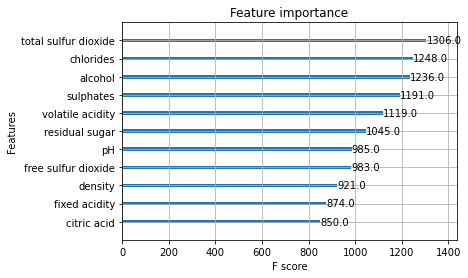

In [78]:
plot_importance(xgb_red)

Incluindo os resultados das métricas do XGBoost no dataframe.

In [79]:
df_results = df_results.append({'Algorithm':'XGBoost',
                                'Wine Color': 'Red',
                                'Accuracy Score': accuracy_score(y_test_red_le,xgb_red_predict),
                                'Precision Score': precision_score(y_test_red_le,xgb_red_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_red_le,xgb_red_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_red_le,xgb_red_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_red_le, xgb_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335


In [80]:
le = preprocessing.LabelEncoder()
le.fit(y_train_white)
y_train_white_le = le.transform(y_train_white)
y_test_white_le = le.transform(y_test_white)

In [81]:
xgb_white=XGBClassifier()
xgb_white.fit(X_train_white,y_train_white_le)
xgb_white_predict = xgb_white.predict(X_test_white)
xgb_white_predict_proba = xgb_white.predict_proba(X_test_white)

In [82]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(xgb_white, X_train_white, y_train_white_le, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.87093779 0.86861653 0.85886722 0.85190344 0.85654596]
Average CV Score:  0.8613741875580316
Number of CV Scores used in Average:  5


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

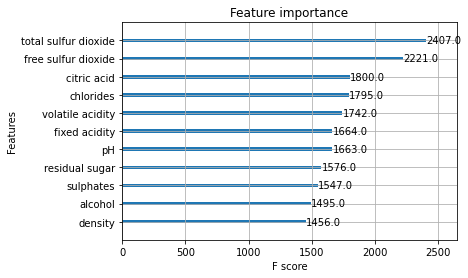

In [83]:
plot_importance(xgb_white)

In [84]:
df_results = df_results.append({'Algorithm':'XGBoost',
                                'Wine Color': 'White',
                                'Accuracy Score': accuracy_score(y_test_white_le,xgb_white_predict),
                                'Precision Score': precision_score(y_test_white_le,xgb_white_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_white_le,xgb_white_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_white_le,xgb_white_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_white_le, xgb_white_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509


Random Forest

In [85]:
rfc_red = RandomForestClassifier()
rfc_red.fit(X_train_red, y_train_red)
rfc_red_predict = rfc_red.predict(X_test_red)
rfc_red_predict_proba = rfc_red.predict_proba(X_test_red)

In [86]:
print(classification_report(y_test_red,rfc_red_predict))
print(confusion_matrix(y_test_red,rfc_red_predict))

              precision    recall  f1-score   support

           3       0.97      1.00      0.99       186
           4       0.90      0.96      0.93       177
           5       0.73      0.74      0.73       202
           6       0.70      0.55      0.62       223
           7       0.82      0.91      0.86       218
           8       0.95      0.98      0.96       220

    accuracy                           0.85      1226
   macro avg       0.85      0.86      0.85      1226
weighted avg       0.84      0.85      0.84      1226

[[186   0   0   0   0   0]
 [  0 170   4   2   1   0]
 [  5  12 149  34   2   0]
 [  0   7  49 123  35   9]
 [  0   0   2  16 198   2]
 [  0   0   0   0   5 215]]


In [87]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(rfc_red, X_train_red, y_train_red, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.83741259 0.86538462 0.85839161 0.8479021  0.86363636]
Average CV Score:  0.8545454545454545
Number of CV Scores used in Average:  5


Incluindo os resultados das métricas do Random Forest no dataframe.

In [88]:
df_results = df_results.append({'Algorithm':'Random Forest',
                                'Wine Color': 'Red',
                                'Accuracy Score': accuracy_score(y_test_red,rfc_red_predict),
                                'Precision Score': precision_score(y_test_red,rfc_red_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_red,rfc_red_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_red,rfc_red_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_red, rfc_red_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509
4,Random Forest,Red,0.849103,0.842585,0.849103,0.843593,0.974824


In [89]:
rfc_white = RandomForestClassifier()
rfc_white.fit(X_train_white, y_train_white)
rfc_white_predict = rfc_white.predict(X_test_white)
rfc_white_predict_proba = rfc_white.predict_proba(X_test_white)

In [90]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(rfc_white, X_train_white, y_train_white, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.86954503 0.87047354 0.86954503 0.86722377 0.85793872]
Average CV Score:  0.8669452181987001
Number of CV Scores used in Average:  5


In [91]:
df_results = df_results.append({'Algorithm':'Random Forest',
                                'Wine Color': 'White',
                                'Accuracy Score': accuracy_score(y_test_white,rfc_white_predict),
                                'Precision Score': precision_score(y_test_white,rfc_white_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_white,rfc_white_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_white,rfc_white_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_white, rfc_white_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509
4,Random Forest,Red,0.849103,0.842585,0.849103,0.843593,0.974824
5,Random Forest,White,0.884749,0.881829,0.884749,0.880600,0.985761


SVM

In [92]:
svm_red = svm.SVC(probability=True)
svm_red.fit(X_train_red, y_train_red)
svm_red_predict = svm_red.predict(X_test_red)
svm_red_predict_proba = svm_red.predict_proba(X_test_red)

In [93]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(svm_red, X_train_red, y_train_red, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.38636364 0.39335664 0.38111888 0.41083916 0.38461538]
Average CV Score:  0.39125874125874127
Number of CV Scores used in Average:  5


Incluindo os resultados das métricas do SVM no dataframe.

In [94]:
df_results = df_results.append({'Algorithm':'SVM',
                                'Wine Color': 'Red',
                                'Accuracy Score': accuracy_score(y_test_red,svm_red_predict),
                                'Precision Score': precision_score(y_test_red,svm_red_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_red,svm_red_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_red,svm_red_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_red, svm_red_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509
4,Random Forest,Red,0.849103,0.842585,0.849103,0.843593,0.974824
5,Random Forest,White,0.884749,0.881829,0.884749,0.880600,0.985761
6,SVM,Red,0.394780,0.377449,0.394780,0.368150,0.784030


In [95]:
svm_white = svm.SVC(probability=True)
svm_white.fit(X_train_white, y_train_white)
svm_white_predict = svm_white.predict(X_test_white)
svm_white_predict_proba = svm_white.predict_proba(X_test_white)

In [96]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(svm_white, X_train_white, y_train_white, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.35190344 0.35097493 0.33054782 0.3551532  0.36536676]
Average CV Score:  0.3507892293407614
Number of CV Scores used in Average:  5


In [97]:
df_results = df_results.append({'Algorithm':'SVM',
                                'Wine Color': 'White',
                                'Accuracy Score': accuracy_score(y_test_white,svm_white_predict),
                                'Precision Score': precision_score(y_test_white,svm_white_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_white,svm_white_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_white,svm_white_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_white, svm_white_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1334: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509
4,Random Forest,Red,0.849103,0.842585,0.849103,0.843593,0.974824
5,Random Forest,White,0.884749,0.881829,0.884749,0.880600,0.985761
6,SVM,Red,0.394780,0.377449,0.394780,0.368150,0.784030
7,SVM,White,0.356369,0.344870,0.356369,0.293794,0.769834


KNN

In [98]:
knn_red = KNeighborsClassifier(n_neighbors=3)
knn_red.fit(X_train_red, y_train_red)
knn_red_predict = knn_red.predict(X_test_red)
knn_red_predict_proba = knn_red.predict_proba(X_test_red)

In [99]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(knn_red, X_train_red, y_train_red, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.70104895 0.72202797 0.6958042  0.7027972  0.68006993]
Average CV Score:  0.7003496503496504
Number of CV Scores used in Average:  5


Incluindo os resultados das métricas do KNN no dataframe.

In [100]:
df_results = df_results.append({'Algorithm':'KNN',
                                'Wine Color': 'Red',
                                'Accuracy Score': accuracy_score(y_test_red,knn_red_predict),
                                'Precision Score': precision_score(y_test_red,knn_red_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_red,knn_red_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_red,knn_red_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_red, knn_red_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509
4,Random Forest,Red,0.849103,0.842585,0.849103,0.843593,0.974824
5,Random Forest,White,0.884749,0.881829,0.884749,0.880600,0.985761
6,SVM,Red,0.394780,0.377449,0.394780,0.368150,0.784030
7,SVM,White,0.356369,0.344870,0.356369,0.293794,0.769834
8,KNN,Red,0.712072,0.697895,0.712072,0.693707,0.902352


In [101]:
knn_white = KNeighborsClassifier(n_neighbors=3)
knn_white.fit(X_train_white, y_train_white)
knn_white_predict = knn_white.predict(X_test_white)
knn_white_predict_proba = knn_white.predict_proba(X_test_white)

In [102]:
k_folds = KFold(n_splits = 5)

scores = cross_val_score(knn_white, X_train_white, y_train_white, cv = k_folds)

print("Cross Validation Scores: ", scores)
print("Average CV Score: ", scores.mean())
print("Number of CV Scores used in Average: ", len(scores))

Cross Validation Scores:  [0.77065924 0.76648097 0.76880223 0.76183844 0.76648097]
Average CV Score:  0.7668523676880223
Number of CV Scores used in Average:  5


In [103]:
df_results = df_results.append({'Algorithm':'KNN',
                                'Wine Color': 'White',
                                'Accuracy Score': accuracy_score(y_test_white,knn_white_predict),
                                'Precision Score': precision_score(y_test_white,knn_white_predict, average='weighted'),
                                'Recall Score': recall_score(y_test_white,knn_white_predict, average='weighted'),
                                'F1 Score': f1_score(y_test_white,knn_white_predict, average='weighted'),
                                'Roc Auc Score': roc_auc_score(y_test_white, knn_white_predict_proba, multi_class='ovr')}, ignore_index=True)
df_results

,Algorithm,Wine Color,Accuracy Score,Precision Score,Recall Score,F1 Score,Roc Auc Score
0,GradientBoost,Red,0.802610,0.796315,0.802610,0.797609,0.958002
1,GradientBoost,White,0.760399,0.756724,0.760399,0.755835,0.954055
2,XGBoost,Red,0.838499,0.832913,0.838499,0.834480,0.970335
3,XGBoost,White,0.882582,0.880478,0.882582,0.881133,0.984509
4,Random Forest,Red,0.849103,0.842585,0.849103,0.843593,0.974824
5,Random Forest,White,0.884749,0.881829,0.884749,0.880600,0.985761
6,SVM,Red,0.394780,0.377449,0.394780,0.368150,0.784030
7,SVM,White,0.356369,0.344870,0.356369,0.293794,0.769834
8,KNN,Red,0.712072,0.697895,0.712072,0.693707,0.902352
9,KNN,White,0.799393,0.784160,0.799393,0.785183,0.941615


Como o Random Forest apresentou os melhores resultados, estabelecemos os hiperparâmetros para tunnar o modelo usando o Random Grid e o Grid Search

Random Search:

In [104]:
#Estabelecendo os hiperparâmetros para o Random Search

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [105]:
random_search = RandomizedSearchCV(estimator = rfc_red, param_distributions = random_grid,
                                   n_iter = 50, scoring = 'roc_auc', refit = True, cv = 3, n_jobs = -1,
                                   random_state=0)

In [106]:
#Esse demora pra dedéu...
search_result_red = random_search.fit(X_train_red, y_train_red)

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:953: UserWarning:

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan]



In [107]:
tunned_model_red = search_result_red.predict(X_test_red)

In [108]:
search_model_red_proba = search_result_red.predict_proba(X_test_red)

In [109]:
print(confusion_matrix(y_test_red, tunned_model_red))

print(classification_report(y_test_red, tunned_model_red))

[[186   0   0   0   0   0]
 [  2 164   7   3   1   0]
 [  4  14 144  38   2   0]
 [  0   4  64 108  38   9]
 [  1   0   2  17 196   2]
 [  0   0   0   0   8 212]]
              precision    recall  f1-score   support

           3       0.96      1.00      0.98       186
           4       0.90      0.93      0.91       177
           5       0.66      0.71      0.69       202
           6       0.65      0.48      0.56       223
           7       0.80      0.90      0.85       218
           8       0.95      0.96      0.96       220

    accuracy                           0.82      1226
   macro avg       0.82      0.83      0.82      1226
weighted avg       0.82      0.82      0.82      1226



In [110]:
y_onehot_rs_red = pd.get_dummies(y_test_red, columns=search_result_red.classes_)

Gráfico ROC AUC Score - Random Search - Vinhos tintos

In [111]:
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in range(search_model_red_proba.shape[1]):
    y_true = y_onehot_rs_red.iloc[:, i]
    y_score = search_model_red_proba[:, i]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_score = roc_auc_score(y_true, y_score)

    name = f"{y_onehot_rs_red.columns[i]} (AUC={auc_score:.2f})"
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()

In [112]:
search_result_white = random_search.fit(X_train_white, y_train_white)

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:953: UserWarning:

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan]



In [113]:
tunned_model_white = search_result_white.predict(X_test_white)

In [114]:
search_model_white_proba = search_result_white.predict_proba(X_test_white)

In [115]:
print(classification_report(y_test_white, tunned_model_white))

              precision    recall  f1-score   support

           3       0.98      1.00      0.99       662
           4       0.90      0.95      0.93       704
           5       0.76      0.79      0.77       633
           6       0.75      0.58      0.65       679
           7       0.77      0.85      0.81       626
           8       0.93      0.94      0.94       661
           9       1.00      1.00      1.00       651

    accuracy                           0.87      4616
   macro avg       0.87      0.87      0.87      4616
weighted avg       0.87      0.87      0.87      4616



In [116]:
y_onehot_rs_white = pd.get_dummies(y_test_white, columns=search_result_white.classes_)

Gráfico ROC AUC Score - Random Search - Vinhos brancos

In [117]:
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in range(search_model_white_proba.shape[1]):
    y_true = y_onehot_rs_white.iloc[:, i]
    y_score = search_model_white_proba[:, i]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_score = roc_auc_score(y_true, y_score)

    name = f"{y_onehot_rs_white.columns[i]} (AUC={auc_score:.2f})"
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()

Grid Search

In [118]:
#Estabelecendo os hiperparâmetros para o Grid Search

param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [119]:
grid_search = GridSearchCV(estimator = rfc_red, param_grid = param_grid,
                                   refit = True, n_jobs= -1)

In [120]:
grid_search_red_result = grid_search.fit(X_train_red , y_train_red)

In [121]:
grid_tunned_model_red = grid_search.predict(X_test_red)

In [122]:
grid_tunned_model_red_proba = grid_search.predict_proba(X_test_red)

In [123]:
print(classification_report(y_test_red, grid_tunned_model_red))

              precision    recall  f1-score   support

           3       0.96      1.00      0.98       186
           4       0.84      0.93      0.88       177
           5       0.64      0.66      0.65       202
           6       0.67      0.43      0.52       223
           7       0.76      0.90      0.83       218
           8       0.91      0.95      0.93       220

    accuracy                           0.80      1226
   macro avg       0.80      0.81      0.80      1226
weighted avg       0.79      0.80      0.79      1226



In [124]:
y_onehot_gs_red = pd.get_dummies(y_test_red, columns=grid_search_red_result.classes_)

Gráfico ROC AUC Score - Grid Search - Vinhos tintos

In [125]:
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in range(grid_tunned_model_red_proba.shape[1]):
    y_true = y_onehot_gs_red.iloc[:, i]
    y_score = grid_tunned_model_red_proba[:, i]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_score = roc_auc_score(y_true, y_score)

    name = f"{y_onehot_gs_red.columns[i]} (AUC={auc_score:.2f})"
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()

In [126]:
grid_search_white_result = grid_search.fit(X_train_white , y_train_white)
grid_tunned_model_white = grid_search.predict(X_test_white)
grid_tunned_model_white_proba = grid_search.predict_proba(X_test_white)

In [127]:
y_onehot_gs_white = pd.get_dummies(y_test_white, columns=grid_search_white_result.classes_)

Gráfico ROC AUC Score - Grid Search - Vinhos brancos

In [128]:
fig = go.Figure()
fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in range(grid_tunned_model_white_proba.shape[1]):
    y_true = y_onehot_gs_white.iloc[:, i]
    y_score = grid_tunned_model_white_proba[:, i]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_score = roc_auc_score(y_true, y_score)

    name = f"{y_onehot_gs_white.columns[i]} (AUC={auc_score:.2f})"
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

fig.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=700, height=500
)
fig.show()

Após todos seus esforços, o amado chefe lhe pediu para utilizar um algoritmo que ele ouviu falar, criado pelo matemático inglês Thomas Bayes. Cabe a você, mais uma vez a, aplicar o algoritmo e apresentar os resultado. Em seguida, faça uma breve explicação do principal problema desse método para solucionar problemas complexos.  

In [129]:
gnb = GaussianNB()
y_pred_red = gnb.fit(X_train_red, y_train_red).predict(X_test_red)

In [130]:
print(confusion_matrix(y_test_red, y_pred_red))

[[147  15  13  11   0   0]
 [ 73  61  27  11   4   1]
 [ 30  40  85  29  11   7]
 [ 19  40  37  43  42  42]
 [  3  10   4  16 101  84]
 [  0   0   0  10  17 193]]


In [131]:
print(classification_report(y_test_red,y_pred_red))

              precision    recall  f1-score   support

           3       0.54      0.79      0.64       186
           4       0.37      0.34      0.36       177
           5       0.51      0.42      0.46       202
           6       0.36      0.19      0.25       223
           7       0.58      0.46      0.51       218
           8       0.59      0.88      0.71       220

    accuracy                           0.51      1226
   macro avg       0.49      0.51      0.49      1226
weighted avg       0.49      0.51      0.49      1226



In [132]:
accuracy_score(y_test_red, y_pred_red)

0.5138662316476346

In [133]:
y_pred_white = gnb.fit(X_train_white, y_train_white).predict(X_test_white)

In [134]:
print(confusion_matrix(y_test_white, y_pred_white))

[[256 106 149   0  89  11  51]
 [ 23 373 171  12 103  21   1]
 [ 33 121 342  15 100  16   6]
 [ 26  46 220  46 250  67  24]
 [  4   6  82  26 287 146  75]
 [ 12   3  71  21 245 226  83]
 [  0   0  28   0  17   0 606]]


In [135]:
print(classification_report(y_test_white,y_pred_white))

              precision    recall  f1-score   support

           3       0.72      0.39      0.50       662
           4       0.57      0.53      0.55       704
           5       0.32      0.54      0.40       633
           6       0.38      0.07      0.12       679
           7       0.26      0.46      0.33       626
           8       0.46      0.34      0.39       661
           9       0.72      0.93      0.81       651

    accuracy                           0.46      4616
   macro avg       0.49      0.47      0.44      4616
weighted avg       0.49      0.46      0.44      4616



In [136]:
accuracy_score(y_test_white, y_pred_white)

0.462738301559792

### Modelos não Supervisionados

**Utilize o dataset 'wines.csv' e 'wines_splines.csv'**

Chuck Norris tem um amigo famoso no mundo da ciência de dados, seu nome é Rocky Balboa. Em uma conversa sobre alguns métodos que podem ser utilizados para criar novos vetores (features engineering), o Sr.Rocky propôs que fossem utilizados Splines cúbicos. Completamente emocionado com a ideia, Chuck decidiu aplicar esta ténica utilizando até a oitava potências. 

Ele pediu a você que fizesse um estudo comparativo utilizando o PCA. O intuito é analisar se a redução de dimensionalidade pode ser vantajosa para o dataset original e o dataset com Splines. 

1- Compare a variância explicada de cada um dos datasets

2- Explique porque o PCA seria, ou não uma boa abordagem para o dataset com Splines. Ademais, discorra sobre a influência de ruídos.

3- Utilize um loop "for" e crie uma condição para que, quando a variância for maior do que 0.92, seja retornado o número de features totais, faça para ambos datasets.

Considerando que o dataframe armazenado em `wines_splines.csv` possui mais variáveis que o dataframe `wines.csv`, o chamaremos de `df_expanded`.

In [137]:
df_expanded = wines_splines.drop("Unnamed: 0", axis = 1)

Primeiramente vamos checar brevemente como o dataframe está apresentado.

In [138]:
df_expanded.head()

,color,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,...,spl_alcohol_7,spl_alcohol_8,spl_quality_1,spl_quality_2,spl_quality_3,spl_quality_4,spl_quality_5,spl_quality_6,spl_quality_7,spl_quality_8
0,0,6.6,0.42,0.33,2.8,0.034,15.0,85.0,0.99000,3.28,...,792.975760,2057.974073,1.791759,3.210402,5.752268,10.306681,18.467093,33.088589,59.286793,106.227673
1,1,6.9,0.63,0.02,1.9,0.078,18.0,30.0,0.99712,3.40,...,322.640475,736.388938,1.609438,2.590290,4.168912,6.709604,10.798692,17.379824,27.971747,45.018790
2,0,6.9,0.36,0.34,4.2,0.018,57.0,119.0,0.98980,3.28,...,685.098154,1741.246833,2.197225,4.827796,10.607752,23.307613,51.212059,112.524396,247.241368,543.244810
3,0,6.7,0.11,0.34,8.8,0.043,41.0,113.0,0.99620,3.42,...,274.254443,611.591358,1.945910,3.786566,7.368318,14.338084,27.900624,54.292107,105.647563,205.580664
4,0,7.1,0.20,0.34,16.0,0.050,51.0,166.0,0.99850,3.21,...,265.081780,588.270411,1.791759,3.210402,5.752268,10.306681,18.467093,33.088589,59.286793,106.227673


### 1. Comparando a variância explicada de cada um dos datasets

Primeiramente devemos escalonar os datasets, para que o algoritmo funcione adequadamente.

In [139]:
df_target['color'] = df_target['color'].apply(lambda x: 1 if x == 'red' else (0 if x == 'white' else np.nan))

In [140]:
scaler_original = MinMaxScaler()
scale_original = scaler_original.fit_transform(df_target)
df_scale_original = pd.DataFrame(scale_original, columns = df_target.columns)

scaler_splines = MinMaxScaler()
scale_splines = scaler_splines.fit_transform(df_expanded)
df_scale_splines = pd.DataFrame(scale_splines, columns = df_expanded.columns)

Agora que já escalonamos ambos os datasets, podemos aplicar o PCA.

Para avaliar a diferença de variância explicada, buscaremos deixar os dois dataframes com 13 colunas, e a partir de então, explicaremos os resultados encontrados.

In [141]:
pca_original = PCA(n_components=13)
original_comp = pca_original.fit_transform(df_scale_original)
df_original_pca = pd.DataFrame(data = original_comp)

pca_splines = PCA(n_components=13)
splines_comp = pca_splines.fit_transform(df_scale_splines)
df_splines_pca = pd.DataFrame(data = splines_comp)

In [142]:
print("Proporção da variância explicada pelo resultado do PCA aplicado nos dados originais: ", pca_original.explained_variance_ratio_.sum(), 
      "\n",
      "Proporção da variância explicada pelo resultado do PCA aplicado em Splines: ", pca_splines.explained_variance_ratio_.sum())

Proporção da variância explicada pelo resultado do PCA aplicado nos dados originais:  0.9999999999999999 
 Proporção da variância explicada pelo resultado do PCA aplicado em Splines:  0.9751664327033016


### Explique porque o PCA seria, ou não uma abordagem para o dataset com Splines. Ademais, discorra sobre a influência de ruídos.

**O PCA é um "método não supervisionado estatístico, usado para examinar relações entre um conjunto de variáveis, com o objetivo de identificar uma estrutura básica por trás das mesmas"** (SLIDES DE AULA).

Sendo assim, o utilizamos para reduzir as dimensionalidades de um banco de dados, isto é, diminuir a quantidade de variáveis, mas mantendo o máximo da explicabilidade possível.

Portanto, considerando que na situação inicial o dataset possuía 13 colunas (antes da modificação para splines), a aplicação do algoritmo de PCA para reduzir os dados de Splines se mostra como uma opção muito interessante, pois permite que reduzamos a quantidade inicial de 30 variáveis para apenas 13, voltando a algo próximo da situação inicial. É importante destacar que chegaremos a um resultado próximo, e não exato, pois a nova distribuição dos dados não necessariamente será igual.

Considerando o exposto, podemos dizer que um dos ganhos relevantes do uso do PCA é justamente a redução de dimensões dos dados originais, proporcionando um aumento de eficiência no processo de criação de modelos de _Machine Learning_. Entretanto, o custo disso é uma queda na precisão, visto que a variância explicada cai, como pudemos verificar no exemplo que acabamos de fazer.

Para o dataframe original, que já continha 13 vaiáveis, ao aplicarmos o PCA para "transformá-lo" para 13 variáveis, mantemos a variância explicada do modelo, visto que não há redução de sua dimensionalidade original. Entretanto, ao avaliarmos os resultados da redução de Splines, conseguimos perceber que a variância explicada caiu por volta de 2,5%. Isso ocorre pelo fato de o algoritmo entender que algum tipo de informação acabou sendo perdida durante esse processo de redução, de tal forma que não é possível recuperar 100% da informação que o dataset original, com 30 colunas, possuía.

### Utilize um loop "for" e crie uma condição para que, quando a variância for maior do que 0.92, seja retornado o número de features totais, faça para ambos os datasets.

In [143]:
for i in range(2, 14):
    pca = PCA(n_components = i)
    comp = pca.fit_transform(df_scale_original)
    df_pca = pd.DataFrame(data = comp)
    if pca.explained_variance_ratio_.sum() > 0.92:
        print('Número de features mínimas (pca original) para variancia explicada minima de 0.92: ' + str(df_pca.columns.size))
        break

for i in range(2, 14):
    pca = PCA(n_components = i)
    comp = pca.fit_transform(df_scale_splines)
    df_pca = pd.DataFrame(data = comp)
    if pca.explained_variance_ratio_.sum() > 0.92:
        print('Número de features mínimas (pca splines) para variancia explicada minima de 0.92: ' + str(df_pca.columns.size))
        break

Número de features mínimas (pca original) para variancia explicada minima de 0.92: 6
Número de features mínimas (pca splines) para variancia explicada minima de 0.92: 9


O loop acima indica a quantidade de features mínimas que podemos inserir no PCA para que a variância explicada mínima do dataset seja superior a 0,92.

Optamos por retornar apenas o número mínimo de features pelo fato de que se espera que qualquer quantidade acima da indicada dever, necessariamente, retornar uma proporção maior ou igual de variância total explicada.

**Utilize o dataset 'wines.csv'**

Uma ideia realmente interessante é a clusterização. Por vezes, podemos nos espantar com certos resultados. Aqui, você deve utilizar o dataset original e separar cada nota em um cluster. 

1- Validar os resultados do algoritmo Kmeans com o dataset original

2- Aplicar o método do Cotovelo e averiguar se o número de clusters apotandos são iguais ao número de cluster que você tem de usar.

3- Utilizar o método da Silhueta e averiguar se o número de clusters apotandos são iguais ao número de cluster que você tem de usar.

4- Explique os principais conceitos dos métodos das questões 2 e 3.

Fazendo a clusterização com o Kmeans...

In [144]:
df_cluster = df_target.copy()
df_cluster['color'] = df_cluster['color'].apply(lambda x: 1 if x == 'white' else 0)
X = df_cluster.drop('quality', axis = 1)

In [145]:
kmeans = KMeans(n_clusters=7, random_state=0).fit(X)
y_kmeans = kmeans.predict(X)

Agora podemos plotar o resultado para visualizar a qualidade dos vinhos como as cores. Usando duas das features mais importantes como x e y, vemos que temos uma boa separação entre as qualidades.

In [146]:
px.scatter(X, x = 'chlorides', y = 'total sulfur dioxide', color = kmeans.labels_)

O método do cotovelo pode ser aplicado agora, para compararmos se os resultados são compatíveis com o número de valores unicos encontrados na coluna de qualidade.

In [147]:
sse = {}

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    sse[k] = kmeans.inertia_

In [148]:
px.line(x = list(sse.keys()), y = list(sse.values()))

In [149]:
def numero_otimo_clusters(wcss):
    x1, y1 = 1, wcss.get(1)
    x2, y2 = len(wcss), wcss.get(len(wcss)-1)
    distances = []
    for i in range(1,len(wcss)-2):
        x0 = i+2
        y0 = wcss.get(i)
        numerador = abs((y2-y1)*x0 - (x2-x1)*y0 + x2*y1 - y2*x1)
        denominador = sqrt((y2 - y1)**2 + (x2 - x1)**2)
        distances.append(numerador/denominador)
    return distances

melhor_k = numero_otimo_clusters(sse)

print(melhor_k)

[1.9999999999998583, 2.3891589508019275, 2.985345153892727, 2.4699317783022625, 1.7115148557325008, 0.843750638703223]


In [150]:
silhouette_scores = [] 

for n_cluster in range(2, 8):
    kmeans_silhueta=KMeans(n_clusters = n_cluster).fit_predict(X)
    
    # X_principal originado de um PCA
    silhouette_scores.append( 
        metrics.silhouette_score(X, kmeans_silhueta)) 
    
# Plotando um gráfico de barras para comparar os resultados
k = [2, 3, 4, 5, 6, 7] 
px.bar(x = k, y = silhouette_scores) 
print(silhouette_scores)

[0.5094282376210382, 0.5040590378966535, 0.45044097173035685, 0.4176414413431517, 0.39091236117598416, 0.36571883084705437]


Podemos ver que o resultado não chega próximo ao número esperado de 7 clusters. Provavelmente as cores são identificadas como formas mais eficientes de separar os vinhos do que a qualidade.

A Università di Bologna tem cursos de graduação e pós graduação em enologia. Os grandes enólogos do mundo são os únicos que podem fazer o doutorado nesta renomada universidade. Esta instituição tem um contrato milionário com o Sr.Donald, onde todos os alunos poderiam comparecer uma semana a cada três meses para estudar as características, mecânicas de plantações, tecnologias, processos de confecção dos vinhos, entre outras questões. Todos os professores, escanções extramente conceituados, sempre estão presentes. 

Caso infortúnio, O Sr.Hafþór Júlíus Björnsson, mais conhecido como "o Montanha", chefe de segurança cibernética da empresa apertou o botão DEFCON-1 ao perceber que os servidores tinham sido 'hackeados'. Momento em que notou que os bancos de dados que continham as notas dos vinhos haviam sido alterados/deletados e o backup infectado por um Ransomware chamado "HUE HUE HUE BR". Aparentemente, os black-hats conseguiram alterar de 5% a 25% dos dados referentes aos vinhos tintos, antes que o Montanha conseguisse exterminar as conexões dos servidores. 

O Sr.Donald Shelby aproximou-se de você para falar você sobre as políticas da empresa, criadas por sua esposa, dispunham sobre o bem estar, ambiente não tóxico, agregação dos "colaboradores" ~pseudo escrevados~ como familiares, dentre outros ideais da mesma seara. Em seguida incorporou o espírito de Don Corleone e proferiu uma de suas máximas ao falar "Política é saber a hora de puxar o gatilho".   

Uma das regras empresa dispõe sobre a impossibilidade de extrair datasets como arquivos e, toda vez que for utilizar os dados no Jupyter Notebook, deve ser realizado uma query no datalake. Ocorre que, 'sem querer querendo', você estava desatento e salvou os dados para estudos quando estivesse em casa. Nítido que se disse-se que havia copiado dados seria torturado, por isso não poderia simplesmente aparecer com os dados e colocá-los de volta no banco e como não queria morrer, pegou seu disquete que continha a cópia de parte dos dados e decidiu fazer um modelo usando Isolation Forest. A ideia é treinar o modelo utilizando o dataset 'wines.csv', fazer a predição no dataset 'wines_hacked.csv' e comparar os resultados com o dataset 'wines.csv'. Já que ninguém na vinícula entende o que você faz e Machine Learning é considerado mágica, isso pode dar certo. 

1- Analise seus resultados e altere o modelo até que consiga acertar todos os vinhos com nota oito e nove. Os vinhos com notas menores do que oito que não sejam devidamente identificados pelo algoritmo com a devida nota podem ser deletados.

3- Após terminar as questões acima, exporte o dataset com o nome 'wines_questao_final.csv'.

**ps**: Não haverá desconto de nota caso não consiga acertar todos os vinho de nota oito e nove, porém se não houver uma acurácia maior de 90% seus resultados na próxima questão podem ser devidamente prejudicados.

Tratando os dataset para o treinamento do modelo...

In [151]:
df_tree = df_target.copy()
df_tree = df_target[df_target['color'] == 1]

df_hack = wines_hacked.drop('Unnamed: 0', axis = 1).copy()
df_hack = df_hack[df_hack['color'] == 'red']
df_hack['color'] = 1

Treinando o modelo...

In [152]:
clf = IsolationForest(n_estimators=100, contamination= 0.37,
                        max_features=12, bootstrap=False, n_jobs=-1,
                       random_state=0).fit(df_tree.drop('color', axis = 1))

pred = clf.predict(df_hack.drop('color', axis = 1))
df_hack['anomaly'] = pred

c:\Users\Leonam\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



In [153]:
total = len(df_tree[(df_target['quality'] >= 8)])
acerto = len(df_tree[(df_hack['anomaly'] == -1) & (df_target['quality'] >= 8)])
print('acerto: ' + str(acerto/total))

acerto: 0.9444444444444444


C:\Users\Leonam\AppData\Local\Temp/ipykernel_11848/4281796575.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

C:\Users\Leonam\AppData\Local\Temp/ipykernel_11848/4281796575.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



94% de acerto parece um valor razoável, apesar do modelo com alta contaminação, os funcionários da venícula acham que Machine Learning é bruxaria e só buscamos uma desculpa para justificar como conseguimos recuperar os valores originais sem a tortura que viria ao descobrirem o backup "acidental". 

In [154]:
df_fim = df_tree.drop(df_tree[(df_hack['anomaly'] == -1) & (df_target['quality'] < 8)].index)
df_fim.to_csv('wines_questao_final.csv', index=False)

C:\Users\Leonam\AppData\Local\Temp/ipykernel_11848/2416634359.py:1: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



### Esse é o grande momento. Boa sorte!!!

Utilize o dataset **'wines_questao_final.csv'** que você exportou da questão anterior e valide com o dataset **'wines_momento_final.csv'**. 

O grande e mais famoso enólogo do mundo, nascido na Bélgica, Leopoldo II marcou uma data para comparecer na vinícula e degustar seus melhores rótulos. Ocorre que ele é considerado como quem solidifica a vinícula como uma das melhores de todos os tempos, ou como ceifador, já que com suas análises minuciosas publicava críticas tão severas que 80% das vinículas eram fechadas pela posterior falta de aceitação do mercado. Apenas 19.999% sobreviviam sem regalias e somente 0.001% se tornavam uma lenda.

O Sir.Donald, tomado pela a ansiedade, estava completamente desiquilibrado. Seu filho tomava leite da papoula para suportar a pressão. Com enorme conhecimento em administração e a serenidade de um bebê, a esposa do Sir.Shalbey, Srta.Audrey Hepburn assumiu a liderança do projeto. 

Primeiramente ordenou que todos os vinhos que já vinham há algum tempo em processo de envelhecimento em barricas de carvalho  fossem engarrafados e que amostras de todos fossem coletadas para análise. 

Sua maior preocupação é que somente sejam servidos os vinhos de nota oito ou nove, pois ambos são de mesmíssima qualidade, ficando a diferença de nota a critério de quem o julgou. Em **<u>hipótese nenhuma</u>** um vinho que não tenha tais notas pode ser servido.

De todas as novas garrafas, serão servidas somente três que você autorizar. Aparentemente o Sr.Leopoldo só toma vinho tinto! 

A vinícula e sua vida dependem de você xD

**Dica**: Talvez retornar a probabilidade de ser uma garrafa oito ou nove seja uma boa opção

A ideia é treinar um modelo que identifique quais os vinhos tintos que tenham qualidade 8 ou maior e fazer a previsão no dataset novo para saber se é uma garrafa que pode ser escolhida. Deixar essa escolha ao acaso certamente acarretaria na falência da venícula e com certeza os Shelby não gostariam nada disso. Portanto começamos tratando os datasets a serem usados...

In [180]:
df_finalmente = df_target.copy()
questao_final = questao_final.drop('Unnamed: 0', axis = 1)


In [181]:
X = df_finalmente.drop(['color'], axis = 1)
y = df_finalmente['color']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

In [182]:
q = RandomForestClassifier()
q.fit(X_train, y_train)
q.score(X_test, y_test)

0.9943589743589744

In [183]:
questao_final['color'] = q.predict(questao_final)

In [184]:
questao_final['color'] = questao_final['color'].apply(lambda x: 1 if x == 'red' else 0)

In [185]:
questao_final['best'] = np.where((questao_final['quality']>=8) & (questao_final['color']==1),1,0)

Criamos duas novas colunas no dataframe, uma com a cor prevista do vinho, e outra classificando a garrafa como sendo uma das melhores, e que portanto, pode ser servida ao famoso enólogo Leopoldo II.

Agora um novo modelo pode nos informar se somos capazes de identificar qualquer garrafa como sendo adequada para o consumo de figuras importantes. Evitando assim problemas futuros com a correta identificação dessas garrafas.

In [186]:
X_best = questao_final.drop('best', axis = 1)
y_best = questao_final['best']
clf = RandomForestClassifier()
clf.fit(X_best, y_best)

RandomForestClassifier()

In [187]:
pred_forest=clf.predict(X_best)

In [188]:
clf.score(X_best, y_best)

1.0

In [189]:
print(classification_report(y_best, pred_forest))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     14145
           1       1.00      1.00      1.00       124

    accuracy                           1.00     14269
   macro avg       1.00      1.00      1.00     14269
weighted avg       1.00      1.00      1.00     14269



Como as métricas mostram, acertamos 100% das garrafas que podem ser servidas, salvando assim nossa vida e nosso emprego (e claro, nossa amada venícula e seus donos, que nos consideram da família e nunca fariam nada que pudesse nos prejudicar).